<a href="https://colab.research.google.com/github/opon13/DeepLearning_course/blob/main/mage%20classification%20with%20distribution%20shift/aiunict2023_OP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle
!pip install matplotlib==3.5
!pip install captum==0.5
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 91.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 6.2 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 21.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 11.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
from matplotlib import cm
import random, os, random, cv2
import warnings, time, csv
from pathlib import Path
from PIL import Image
from google.colab import files, drive

import torch
import torchvision
import torch.nn as nn
import torchvision.transforms as T
import torch.nn.functional as F
import torch.optim as optim
from torchsummary import summary
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import fasterrcnn_resnet50_fpn, retinanet_resnet50_fpn_v2, FasterRCNN_MobileNet_V3_Large_FPN_Weights
from torch.utils.data import Dataset, DataLoader, Subset, random_split
from torchmetrics.classification import Accuracy
from torchvision import transforms as torchtrans
from torchvision.models import GoogLeNet_Weights, ResNet101_Weights

import captum
from captum.attr import IntegratedGradients, LayerGradCam, LayerAttribution, NoiseTunnel
from captum.attr import visualization as viz

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from albumentations.core.transforms_interface import ImageOnlyTransform

random_seed = 13
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
warnings.filterwarnings('ignore')
dev = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('dev: ', dev)

dev:  cuda


In [ ]:
#files.upload()
drive.mount('/content/drive')
!cp /content/drive/MyDrive/kaggle.json /content/kaggle.json

Mounted at /content/drive


In [ ]:
#!mkdir-p ~/.kaggle/ 
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

# Download it as a zip
!kaggle competitions download -c aiunict-2023

# unzip the file 
!unzip aiunict-2023.zip -d aiunict-2023

 97% 417M/431M [00:06<00:00, 89.9MB/s]
100% 431M/431M [00:06<00:00, 73.4MB/s]
Archive:  aiunict-2023.zip
  inflating: aiunict-2023/submission.csv  
  inflating: aiunict-2023/test.csv   
  inflating: aiunict-2023/test/000.jpg  
  inflating: aiunict-2023/test/001.jpg  
  inflating: aiunict-2023/test/002.jpg  
  inflating: aiunict-2023/test/003.jpg  
  inflating: aiunict-2023/test/004.jpg  
  inflating: aiunict-2023/test/005.jpg  
  inflating: aiunict-2023/test/006.jpg  
  inflating: aiunict-2023/test/007.jpg  
  inflating: aiunict-2023/test/008.jpg  
  inflating: aiunict-2023/test/009.jpg  
  inflating: aiunict-2023/test/010.jpg  
  inflating: aiunict-2023/test/011.jpg  
  inflating: aiunict-2023/test/012.jpg  
  inflating: aiunict-2023/test/013.jpg  
  inflating: aiunict-2023/test/014.jpg  
  inflating: aiunict-2023/test/015.jpg  
  inflating: aiunict-2023/test/016.jpg  
  inflating: aiunict-2023/test/017.jpg  
  inflating: aiunict-2023/test/018.jpg  
  inflating: aiunict-2023/test/019.

In [ ]:
def torch_to_pil(img):
    return torchtrans.ToPILImage()(img).convert('RGB')

def GradCAM(ds, layer, classes, index):
    img, name_file = ds[index]
    model.eval()
    with torch.no_grad():
        inputs = img.unsqueeze_(0).to(dev)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        print(classes[str(int(preds))])
        layer_gradcam = LayerGradCam(model, layer)
    attributions_lgc = layer_gradcam.attribute(inputs, target=preds)
    upsamp_attr_lgc = LayerAttribution.interpolate(attributions_lgc, inputs.shape[2:])
    print(attributions_lgc.shape)
    print(upsamp_attr_lgc.shape)
    print(inputs.shape)
    _ = viz.visualize_image_attr_multiple(upsamp_attr_lgc[0].cpu().permute(1,2,0).detach().numpy(),
                                          img.squeeze_(0).permute(1,2,0).numpy(),
                                          ["original_image","blended_heat_map","masked_image"],
                                          ["all","positive","positive"],
                                          show_colorbar=True,
                                          titles=["Original", "Positive Attribution", "Masked"],
                                          fig_size=(18, 6))
#visualize dataset transformation
def plot_dataset(dset, num_imgs):
    fig, ax = plt.subplots(ncols=num_imgs, figsize=(40,20))
    for i in range(num_imgs):
      j = random.choice(range(len(dset)))
      ax[i].imshow(dset[j][0].permute(1,2,0))
      ax[i].axis('off')
    plt.show()    

In [ ]:
class unictset(Dataset):
    def __init__(self, dset_dir, bboxes = False, train=True, reduce_bboxes=0, transforms=None, focus_type=None, focus_uniform=False, only_class=[i for i in range(8)]):
        self.split = "train" if train else "test"
        self.type = focus_type
        self.uniform = focus_uniform
        self.only = only_class
        self.reduce_costant = reduce_bboxes
        self.dset_dir = Path(dset_dir)/self.split
        self.transforms = transforms
        self.files = []
        folders = sorted(os.listdir(self.dset_dir))
        
        if self.split=="train" :
          if bboxes:
            self.bboxes = pd.read_csv(dset_dir+"train.csv")
          for folder in folders:
              class_idx= folders.index(folder)
              folder_dir = self.dset_dir/folder
              files = os.listdir(folder_dir)
              self.files += [{"id_img": folder+"/"+x, "file": folder_dir/x, "class": class_idx, "focus": self.type} for x in files]
        else:
          if bboxes:
            self.bboxes = pd.read_csv(dset_dir+"test.csv")
          self.file=folders
          for file in folders:
            self.files.append(self.dset_dir/file)
    
    def __len__(self):
        return len(self.files)
    
    def __getitem__(self, i):
        
        if self.split == "train":
            item = self.files[i]
            file = item['file']
            
            img = cv2.imread(str(file))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
            
            name_file_img = item['id_img']
            bbox_img = self.bboxes[self.bboxes["image"]==name_file_img]
            boxes = []
            xmin = int(bbox_img['x1'])+self.reduce_costant
            xmax = int(bbox_img['x2'])-self.reduce_costant
            ymin = int(bbox_img['y1'])+self.reduce_costant
            ymax = int(bbox_img['y2'])-self.reduce_costant
            boxes.append([xmin, ymin, xmax, ymax])
            boxes = torch.as_tensor(boxes, dtype=torch.int64)          
            labels = torch.tensor(item['class'],dtype=torch.int64).unsqueeze(0)
            target = {}
            target["boxes"] = boxes
            target["labels"] = labels
            target["image_id"] = torch.tensor([i])
            if self.transforms:
                sample = {'image' : img,
                          'bboxes' : target['boxes'],
                          'labels' : labels
                         }
                sample = self.transforms(**sample)
                img = sample['image']
                target['boxes'] = torch.as_tensor((sample['bboxes']),dtype=torch.int64)
            bb=target['boxes'][0]
            if item['class'] in self.only:
                if item['focus']=='blur':
                    Y = torch.rand(3, 350, 350) 
                elif item['focus']=='black':
                    Y = torch.zeros(3, 350, 350)
                else:
                    Y = torch.ones(3,350,350)
                Y[0:3, int(bb[1]):int(bb[3]), int(bb[0]):int(bb[2])] = 1
                if self.uniform and item['focus']=='black':
                    img = torch.mul(img,Y)
                    R = torch.full((1,350,350), random.randint(0,255))
                    G = torch.full((1,350,350), random.randint(0,255))
                    B = torch.full((1,350,350), random.randint(0,255))
                    U = torch.concat([R,G,B],dim=0)
                    img += U
                    img[0:3, int(bb[1]):int(bb[3]), int(bb[0]):int(bb[2])] -= U[0:3, int(bb[1]):int(bb[3]), int(bb[0]):int(bb[2])]
                    img_res = img/255
                else:
                    img_res = torch.mul(img,Y)/255
            else:
                img_res = img/255
            return img_res, labels, target
        else:
            file = self.files[i]  
            img = cv2.imread(str(file))
            img_res = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
            img_res /= 255.0
            if self.transforms:
                sample = {
                    'image': img_res,
                }
                sample = self.transforms(**sample)
                image = sample['image']
            return image, self.file[i]

In [ ]:
batch_size = 8
#dest_dir = '/kaggle/input/aiunict-2023/'
dest_dir = '/content/aiunict-2023/'
istherevalid = False

classes = {'0':'plug',
          '1':'mobile phone',
          '2':'scissor',
          '3':'lamp',
          '4':'pepsi',
          '5':'sunglasses',
          '6':'ball',
          '7':'cup'}

trans1 = A.Compose([
        A.HorizontalFlip(p=0.7),
        A.VerticalFlip(p=0.7),
        A.ShiftScaleRotate(scale_limit=0.3, rotate_limit=45, p=0.5),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

trans2 = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.ShiftScaleRotate(scale_limit=0.2, rotate_limit=45, p=0.5),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

valid_trans = A.Compose([
        ToTensorV2(p=1.0),
    ])

reduce_costant=5

dataset1 = unictset(dest_dir, train=True, bboxes=True, reduce_bboxes=reduce_costant, transforms=trans1, focus_type=None)
dataset2 = unictset(dest_dir, train=True, bboxes=True, reduce_bboxes=reduce_costant, transforms=trans1, focus_type='blur')
dataset3 = unictset(dest_dir, train=True, bboxes=True, reduce_bboxes=reduce_costant, transforms=trans2, focus_type='black', focus_uniform=None, only_class=[0])
dataset4 = unictset(dest_dir, train=True, bboxes=True, reduce_bboxes=reduce_costant, transforms=trans2, focus_type='black', focus_uniform=True, only_class=[0])
dataset5 = unictset(dest_dir, train=True, bboxes=True, reduce_bboxes=reduce_costant, transforms=trans2, focus_type='black', focus_uniform=True, only_class=[0])
dataset = torch.utils.data.ConcatDataset([dataset3, dataset4])
test_dset = unictset(dest_dir, train=False, transforms=valid_trans) 
if istherevalid:
    len_train = int(len(dataset)*0.8)
    len_valid = len(dataset)-len_train 
    train_dset, valid_dset = random_split(dataset, [len_train, len_valid])

    train_loader = DataLoader(
        train_dset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4)


    valid_loader = DataLoader(
        valid_dset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4)
else:
    train_loader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=4)

test dataset: 


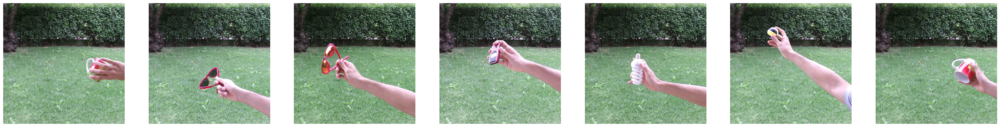

In [ ]:
print('test dataset: ')
plot_dataset(test_dset, 7)

dataset1: 


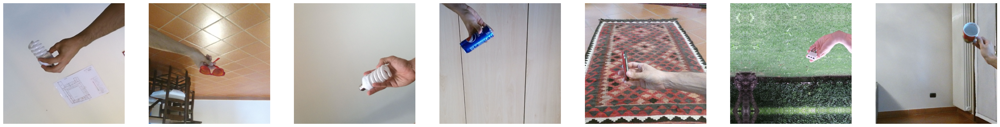

dataset2: 


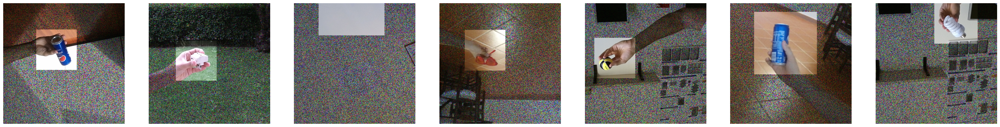

dataset3: 


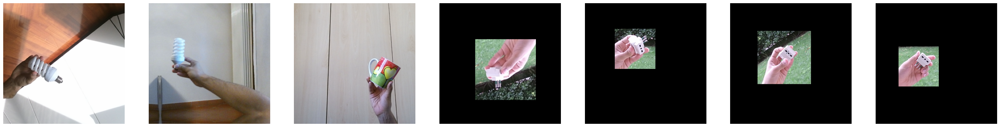

dataset4: 


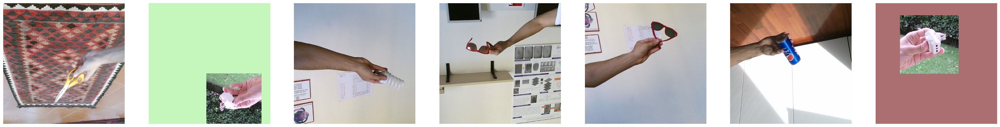

In [ ]:
print('dataset1: ')
plot_dataset(dataset1, 7)
print('dataset2: ')
plot_dataset(dataset2, 7)
print('dataset3: ')
plot_dataset(dataset3, 7)
print('dataset4: ')
plot_dataset(dataset4, 7)

In [ ]:
hl, wl = [], []
for i in range(len(dataset1)):
  img = dataset1[i][0]
  h, w = img.shape[1], img.shape[2]
  hl.append(h)
  wl.append(w)

print(f'unique heights: {np.unique(np.array(hl), return_counts=True)[0]} with frequencies: {np.unique(np.array(hl), return_counts=True)[1]}', 
f'\nunique widhts: {np.unique(np.array(wl), return_counts=True)[0]} with frequencies: {np.unique(np.array(wl), return_counts=True)[1]} \n')
print(f'average height: {sum(hl)/len(hl)} \naverage widht: {sum(wl)/len(wl)}')

unique heights: [350] with frequencies: [1600] 
unique widhts: [350] with frequencies: [1600] 

average height: 350.0 
average widht: 350.0


In [ ]:
inputs, labels, _ = next(iter(train_loader))
print(inputs.shape)
print(labels.shape)

torch.Size([8, 3, 350, 350])

torch.Size([8, 1])


## First attempt using a simple CNN (performance: $33\%$ accuracy)

In [ ]:
class net(nn.Module):
  def __init__(self):
    super().__init__()
    self.convs = nn.Sequential(
        nn.Conv2d(3, 64, kernel_size=3, padding=2, stride=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),
        nn.Dropout(p=0.20),
        nn.Conv2d(64, 128, kernel_size=3, padding=1, stride=1),
        nn.ReLU(),
        nn.Conv2d(128, 128, kernel_size=3, padding=1, stride=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),
        nn.Dropout(p=0.25),
        nn.Conv2d(128, 256, kernel_size=3, padding=1, stride=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),
        nn.Dropout(p=0.25),
        nn.Conv2d(256, 256, kernel_size=3, padding=1, stride=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )
    self.linears = nn.Sequential(
        nn.Linear(256 * 22 * 22, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(),
        nn.Dropout(p=0.5),
        nn.Linear(512, 8)
    )
  def forward(self, x):
    x = self.convs(x)
    x = x.view(-1, 256 * 22 * 22)
    x = self.linears(x)
    #x = nn.Softmax(x)
    return x

In [ ]:
model = net().to(dev)

epochs = 100
initial_lr = 0.001
w_decay = 0.00001
optimizer = torch.optim.Adam(model.parameters(), lr=initial_lr, weight_decay=w_decay)
loss_fn = nn.CrossEntropyLoss()

summary(model, (3,256,256))

----------------------------------------------------------------

        Layer (type)               Output Shape         Param #


            Conv2d-1         [-1, 64, 256, 256]           1,792

              ReLU-2         [-1, 64, 256, 256]               0

         MaxPool2d-3         [-1, 64, 128, 128]               0

           Dropout-4         [-1, 64, 128, 128]               0

            Conv2d-5        [-1, 128, 128, 128]          73,856

              ReLU-6        [-1, 128, 128, 128]               0

            Conv2d-7        [-1, 128, 128, 128]         147,584

              ReLU-8        [-1, 128, 128, 128]               0

         MaxPool2d-9          [-1, 128, 64, 64]               0

          Dropout-10          [-1, 128, 64, 64]               0

           Conv2d-11          [-1, 256, 64, 64]         295,168

             ReLU-12          [-1, 256, 64, 64]               0

        MaxPool2d-13          [-1, 256, 32, 32]               0

           Linear-14   

In [ ]:
train_loss = []
valid_loss = []
train_accuracy = []
valid_accuracy = []
for epoch in range(epochs):
  model.train()
  running_train_loss = 0.0
  running_train_accuracy = 0.0
  for batch, (images, labels) in enumerate(train_loader):
      images = images.to(dev)
      labels = labels.to(dev)
      #foward pass
      output = model(images)
      loss = loss_fn(output, labels)
      #backward pass
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      #calculate performance
      preds = torch.argmax(output, 1)
      batch_accuracy = (preds == labels).sum().item()/images.size(0)
      running_train_loss += loss.item()
      running_train_accuracy += batch_accuracy
  train_loss.append(running_train_loss / len(train_loader))
  train_accuracy.append(running_train_accuracy / len(train_loader))

  model.eval()
  running_val_loss = 0.0
  running_val_accuracy = 0.0
  with torch.no_grad():
      for batch, (images, labels) in enumerate(val_loader):
          images = images.to(dev)
          labels = labels.to(dev)
          output = model(images)
          preds = torch.argmax(output, 1)
          loss = loss_fn(output, labels)
          #calculate performance
          batch_accuracy = (preds == labels).sum().item()/images.size(0)
          running_val_loss += loss.item()
          running_val_accuracy += batch_accuracy
  valid_loss.append(running_val_loss/len(val_loader))
  valid_accuracy.append(running_val_accuracy/len(val_loader))
  print(f'Epoch {epoch+1}/{epochs}:',
        f'train acc {train_accuracy[-1]:.4f}, train loss {train_loss[-1]:.4f},',
        f'val acc: {valid_accuracy[-1]:.4f}, val loss: {valid_loss[-1]:.4f}')

loss={'train' : train_loss, 'val' : valid_loss}
acc={'train' : train_accuracy, 'val' : valid_accuracy}
fig, _ = plt.subplots(figsize=(10,5))
for i in range(2):
if i==0:
  plot = loss
else:
  plot = acc
plt.subplot(1,2,i+1)  
plt.plot(range(epochs), plot['train'], label="Train")
plt.plot(range(epochs), plot['val'], label="Validation")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.show()

In [ ]:
# model expects 224x224 3-color image
transform = T.Compose([
 T.Resize(256),
 T.ToTensor()
])

# standard ImageNet normalization
transform_normalize = T.Normalize(
     mean=[0.5,0.5,0.5],
     std=[0.5,0.5,0.5]
 )

transformed_img = transform(test_img)
input_img = transform_normalize(transformed_img)
input_img = input_img.unsqueeze(0) # the model requires a dummy batch dimension

labels_path = folder
print('label: ', labels_path)

label:  07


## Second approach building my own object detector using a pretrained CNN (max performance: $99\%$ accuracy)

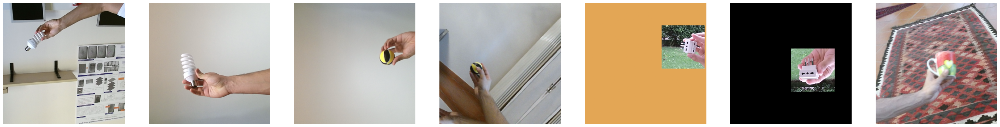

In [ ]:
# Dataset I will use for training
plot_dataset(train_dset, 7)

In [ ]:
model = torchvision.models.googlenet(weights=GoogLeNet_Weights.IMAGENET1K_V1)
#model = torchvision.models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
#model = torchvision.models.resnet101(weights=ResNet101_Weights.IMAGENET1K_V1)

epochs = 15
initial_lr = 0.01 #best 0.004 for ResNet101
w_decay = 0.001  #best 0.00001 for ResNet101
momentum = 0.9
optimizer = torch.optim.SGD(model.parameters(), lr=initial_lr, weight_decay=w_decay)#, momentum=momentum)
loss_fn = nn.CrossEntropyLoss()

in_feature = model.fc.in_features
model.fc = nn.Linear(in_feature,8)
#model

In [ ]:
summary(model.to(dev), (3,350,350))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 175, 175]           9,408
       BatchNorm2d-2         [-1, 64, 175, 175]             128
              ReLU-3         [-1, 64, 175, 175]               0
         MaxPool2d-4           [-1, 64, 88, 88]               0
            Conv2d-5           [-1, 64, 88, 88]           4,096
       BatchNorm2d-6           [-1, 64, 88, 88]             128
              ReLU-7           [-1, 64, 88, 88]               0
            Conv2d-8           [-1, 64, 88, 88]          36,864
       BatchNorm2d-9           [-1, 64, 88, 88]             128
             ReLU-10           [-1, 64, 88, 88]               0
           Conv2d-11          [-1, 256, 88, 88]          16,384
      BatchNorm2d-12          [-1, 256, 88, 88]             512
           Conv2d-13          [-1, 256, 88, 88]          16,384
      BatchNorm2d-14          [-1, 256,

Epoch 1/15: train acc 0.4884, train loss 1.7129
Epoch 2/15: train acc 0.8934, train loss 0.9376
Epoch 3/15: train acc 0.9603, train loss 0.5002
Epoch 4/15: train acc 0.9712, train loss 0.3461
Epoch 5/15: train acc 0.9831, train loss 0.2556
Epoch 6/15: train acc 0.9888, train loss 0.2194
Epoch 7/15: train acc 0.9903, train loss 0.1757
Epoch 8/15: train acc 0.9934, train loss 0.1589
Epoch 9/15: train acc 0.9934, train loss 0.1379
Epoch 10/15: train acc 0.9903, train loss 0.1260
Epoch 11/15: train acc 0.9969, train loss 0.1112
Epoch 12/15: train acc 0.9969, train loss 0.0971
Epoch 13/15: train acc 0.9978, train loss 0.0980
Epoch 14/15: train acc 0.9959, train loss 0.0949
Epoch 15/15: train acc 0.9991, train loss 0.0786


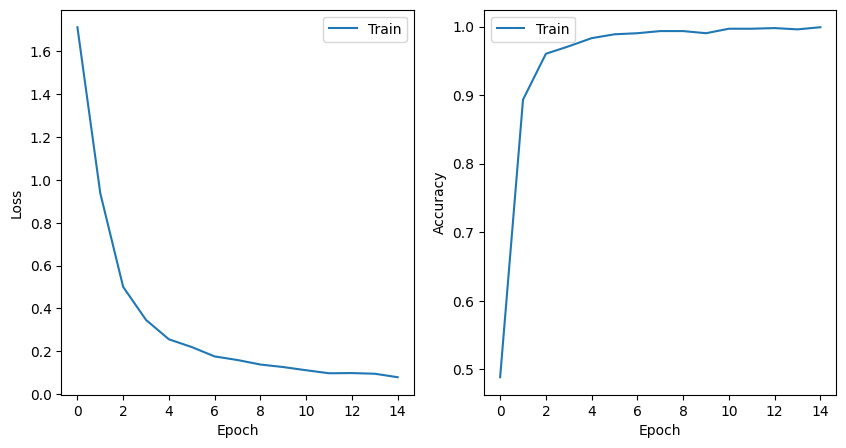

In [ ]:
model.to(dev)

train_loss = []
valid_loss = []
train_accuracy = []
valid_accuracy = []
for epoch in range(epochs):
    
    model.train()
    running_train_loss = 0.0
    running_train_accuracy = 0.0
    for batch, (images, labels, targets) in enumerate(train_loader):
        
        images = images.to(dev) 
        labels = labels.squeeze_().to(dev)
        #foward pass
        output = model(images)
        loss = loss_fn(output, labels)
        #backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        #calculate performance
        preds = torch.argmax(output, 1)
        batch_accuracy = (preds == labels).sum().item()/images.size(0)
        running_train_loss += loss.item()
        running_train_accuracy += batch_accuracy
    train_loss.append(running_train_loss / len(train_loader))
    train_accuracy.append(running_train_accuracy / len(train_loader))
    if istherevalid:
        model.eval()
        running_val_loss = 0.0
        running_val_accuracy = 0.0
        with torch.no_grad():
            for batch, (images, labels, targets) in enumerate(valid_loader):
                images = images.to(dev)
                labels = labels.squeeze_().to(dev)
                output = model(images)
                preds = torch.argmax(output, 1)
                loss = loss_fn(output, labels)
                #calculate performance
                batch_accuracy = (preds == labels).sum().item()/images.size(0)
                running_val_loss += loss.item()
                running_val_accuracy += batch_accuracy
        valid_loss.append(running_val_loss/len(valid_loader))
        valid_accuracy.append(running_val_accuracy/len(valid_loader))
        print(f'Epoch {epoch+1}/{epochs}:',
              f'train acc {train_accuracy[-1]:.4f}, train loss {train_loss[-1]:.4f},',
              f'val acc: {valid_accuracy[-1]:.4f}, val loss: {valid_loss[-1]:.4f}')
    else:
        print(f'Epoch {epoch+1}/{epochs}:',
              f'train acc {train_accuracy[-1]:.4f}, train loss {train_loss[-1]:.4f}')


loss={'train' : train_loss, 'val' : valid_loss}
acc={'train' : train_accuracy, 'val' : valid_accuracy}
fig, _ = plt.subplots(figsize=(10,5))
for i in range(2):
    if i==0:
        plot = loss
        write = 'Loss'
    else:
        plot = acc
        write = 'Accuracy'
    plt.subplot(1,2,i+1)  
    plt.plot(range(epochs), plot['train'], label="Train")
    if istherevalid:
        plt.plot(range(epochs), plot['val'], label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel(write)
    plt.legend()
plt.show()

In [ ]:
#model.layer4[2].conv3 #resnet
model.inception5b.branch3[1].conv #googlent

Conv2d(48, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

414.jpg
pepsi
torch.Size([1, 1, 11, 11])
torch.Size([1, 1, 350, 350])
torch.Size([1, 3, 350, 350])


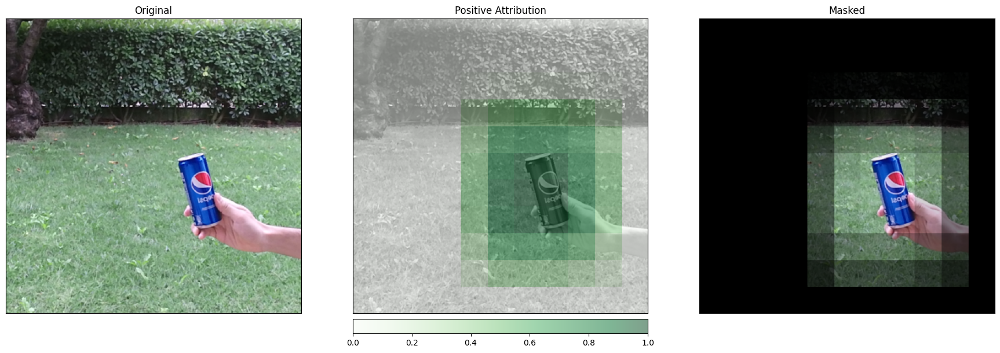

In [ ]:
#layer = model.layer4[2].conv3
layer = model.inception5b.branch4[1].conv
i = random.randint(0, len(test_dset))
print(test_dset[i][1])
GradCAM(test_dset, layer, classes, i)

In [ ]:
csv=True
name = 'submission.csv'

ls_image=[]
ls_class=[]
for idx in range(len(test_dset)):
    img, name_file = test_dset[idx]
    # put the model in evaluation mode
    model.eval()
    with torch.no_grad():
        inputs = img.unsqueeze(0).to(dev)
        output = model(inputs)
        _, pred = torch.max(output, 1)
        pred = pred.cpu().numpy()[0]
    
    ls_image.append(name_file)
    ls_class.append(int(pred))
    #print("file: "+str(name_file)+" preds: "+str(pred))
    
import pandas as pd

d = {'image': ls_image, 'class': ls_class}
df = pd.DataFrame(data=d)

if csv==True:
    df.to_csv(name, index=False)

In [ ]:
#torch.save(model, '/content/drive/MyDrive/OD_resnet101.pth')
#torch.save(model, '/content/drive/MyDrive/OD_googlenet.pth')

In [ ]:
model = torch.load('/content/drive/MyDrive/OD_resnet101.pth')  # 97.25% max accuracy on test
#model = torch.load('/content/drive/MyDrive/OD_googlenet.pth')  # 96.25% max accuracy on test

## Third approach using a pre-trained object detector (max performance: $93\%$ accuracy)

In [ ]:
batch_size = 8
dest_dir = '/kaggle/input/aiunict-2023/'

def collate_fn(batch):
    return tuple(zip(*batch))

train_trans = A.Compose([
        A.Flip(p=0.5),
        A.ShiftScaleRotate(scale_limit=0.1, rotate_limit=45, p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

valid_trans = A.Compose([
        ToTensorV2(p=1.0),
    ])#, bbox_params={
       # 'format': 'pascal_voc', 
       # 'label_fields': ['labels']
    #})

trainloader = DataLoader(
    dataset4,
    batch_size=batch_size,
    shuffle=True,
    num_workers=4,
    collate_fn=collate_fn)


In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=FasterRCNN_MobileNet_V3_Large_FPN_Weights)

num_classes = 9 # 8 Classes + 1 background

in_features = model.roi_heads.box_predictor.cls_score.in_features   # get number of input features for the classifier
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) # replace the pre-trained head with a new one

In [ ]:
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1
        
    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

def apply_nms(orig_prediction, iou_thresh=0.3):
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)   # torchvision returns the indices of the bboxes to keep
    
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    
    return final_prediction

Epoch 1/10: train loss: 0.3156
Epoch 2/10: train loss: 0.2614
Epoch 3/10: train loss: 0.2234
Epoch 4/10: train loss: 0.1870
Epoch 5/10: train loss: 0.1672
Epoch 6/10: train loss: 0.1574
Epoch 7/10: train loss: 0.1459
Epoch 8/10: train loss: 0.1387
Epoch 9/10: train loss: 0.1364
Epoch 10/10: train loss: 0.1292
Time taken to Train the model :00:27:21.76


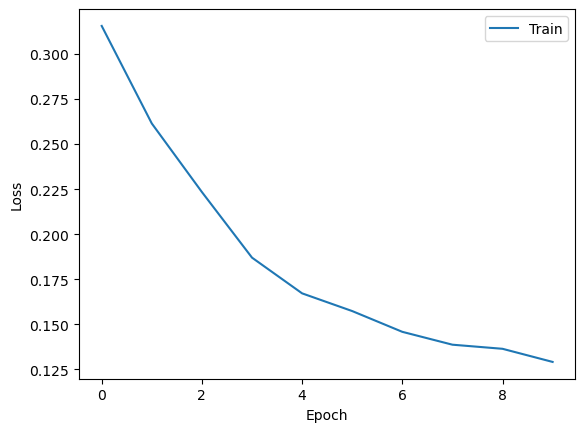

In [ ]:
model.to(dev)

#hyperparameters
epochs=10
initial_lr=0.005
#momentum=0.9
w_decay=0.00005

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=initial_lr,weight_decay=w_decay)#, momentum=momentum, )
lr_scheduler = None#torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

loss_train = Averager()
lossTrainepoch = []
start = time.time()
for epoch in range(epochs):
  loss_train.reset()
  loss_valid.reset()
  model.train()
  for images, _, targets in trainloader:
    images = list(image.to(dev) for image in images)
    targets = [{k: v.to(dev) for k, v in t.items()} for t in targets]
    loss_dict = model(images, targets)  
    losses = sum(loss for loss in loss_dict.values())
    loss_value = losses.item()
    loss_train.send(loss_value)
    optimizer.zero_grad()
    losses.backward()
    optimizer.step()
  if lr_scheduler is not None:
    lr_scheduler.step()
  lossTrainepoch.append(loss_train.value)
  print(f"Epoch {epoch+1}/{epochs}: train loss: {loss_train.value:.4f}")

 
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("Time taken to Train the model :{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

plt.plot(range(epochs), lossTrainepoch, label="Train")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
ls_image=[]
ls_class=[]
ls_true=[]
for idx in range(len(valid_dset)):
    img,target = valid_dset[idx]
    true_target=int(target['labels'])
    ls_true.append(true_target)
        # put the model in evaluation mode
    model.eval()
    with torch.no_grad():
        img=img.to(dev)
        prediction= model([img])[0]
        nms_prediction = apply_nms(prediction, iou_thresh=0.2)
        pred=nms_prediction['labels'].cpu().numpy()[0]
        ls_class.append(pred)
    
    
preds=torch.tensor(ls_class)
target=torch.tensor(ls_true)

accuracy = Accuracy(task="multiclass", num_classes=8)
print("Accuracy Test: " + str(round(float(accuracy(preds,target))*100,2)))

Accuracy Test: 99.25


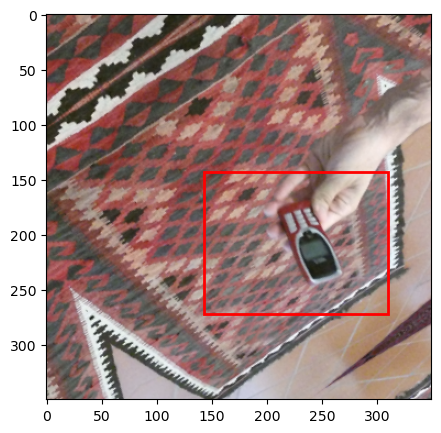

predicted:  1 
true:  1


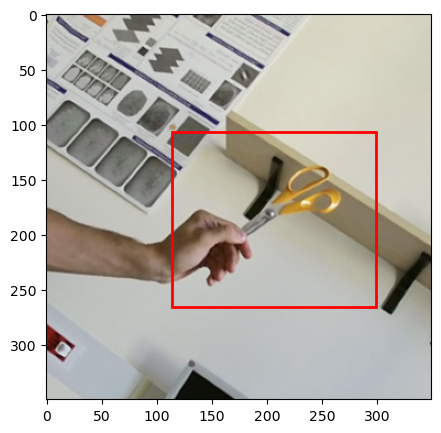

predicted:  2 
true:  2


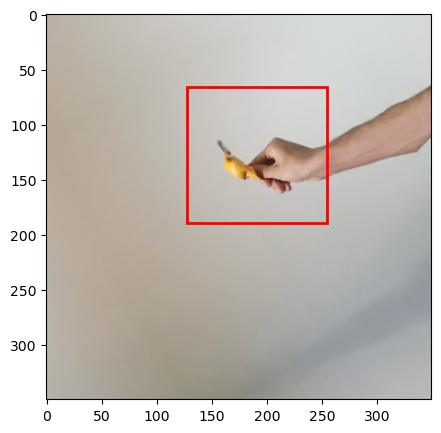

predicted:  5 
true:  2


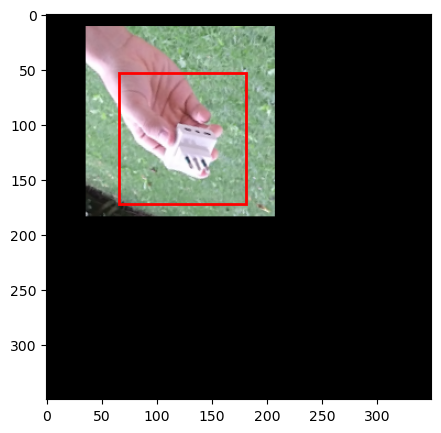

predicted:  3 
true:  0


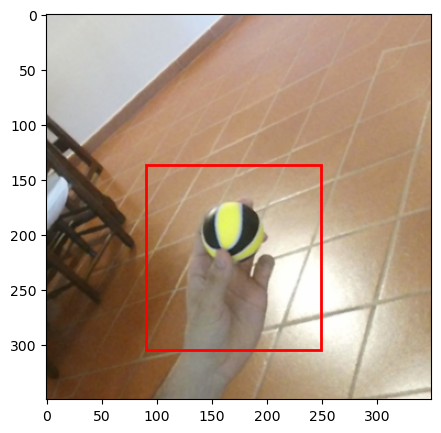

predicted:  6 
true:  6


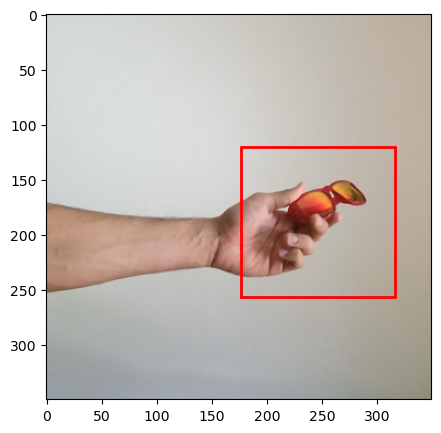

predicted:  5 
true:  5


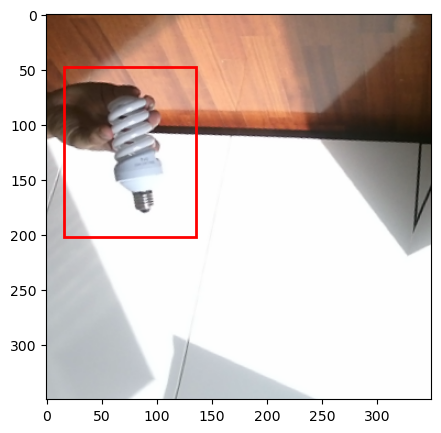

predicted:  3 
true:  3


In [ ]:
num_imgs = 7
#fig, ax = plt.subplots(ncols=num_imgs, figsize=(40,20))

for i in range(num_imgs):
  j = random.choice(range(len(valid_dset)))
  img, _, target = valid_dset[j]
  model.eval()
  with torch.no_grad():
    prediction = model([img.to(dev)])[0]
  nms_prediction = apply_nms(prediction, iou_thresh=0.2)
  plot_img_bbox(torch_to_pil(img), nms_prediction)
  print('predicted: ', nms_prediction['labels'].cpu().numpy()[0], '\ntrue: ', target['labels'].item())
plt.show()


In [ ]:
num_imgs = 7
#fig, ax = plt.subplots(ncols=num_imgs, figsize=(40,20))

for i in range(num_imgs):
  j = random.choice(range(len(test_dset)))
  img, img_id = test_dset[j]
  model.eval()
  with torch.no_grad():
    prediction = model([img.to(dev)])[0]
  nms_prediction = apply_nms(prediction, iou_thresh=0.2)
  print(img_id)
  plot_img_bbox(torch_to_pil(img), nms_prediction)
  print('predicted: ', nms_prediction['labels'].cpu().numpy()[0]-1)
plt.show()

In [ ]:
print=True

with torch.no_grad():
        results = []
        model.eval()
        for i in range(800):
            img, img_id = test_dset[i]
            prediction = model([img.to(dev)])[0]
            nms_prediction = apply_nms(prediction, iou_thresh=0.2)
            x = nms_prediction['labels'].tolist()
            if len(x) > 0:
                x = x[0]
                x = x - 1 
            else:
                print('found an empty prediction!')
                x = random.randint(0,7)
            results.append([img_id, x])
if print==True:
  with open('submission.csv', 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['image', 'class'])
    writer.writerows(results)